In [1]:
import sys
import matplotlib.pyplot as plt
import numpy as np
import os
import tensorflow as tf

import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.animation import FuncAnimation
%matplotlib inline

from sklearn.model_selection import train_test_split
from IPython.display import HTML

# Add the architecture path for the DenseEncoderDecoder and NMSE
sys.path.append("../tools/")
from cubes2npy import CubeFiles
from tensorflow.keras import layers

# Hide GPU from visible devices
#tf.config.set_visible_devices([], 'GPU')


2023-05-21 21:46:17.105452: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-05-21 21:46:17.137752: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
cubes=CubeFiles()
files=sorted(os.listdir(os.path.join('..','data','cis-DCE-hann-x-10k')))
for f in files :
    cubes.read_cube(fname=os.path.join('..','data','cis-DCE-hann-x-10k',f))

cube_data=cubes.density_as_numpy()
print(cube_data.shape)

Reading :  ../data/cis-DCE-hann-x-10k/density.0000000001.cube  as cube number 1
Reading :  ../data/cis-DCE-hann-x-10k/density.0000000100.cube  as cube number 2
Reading :  ../data/cis-DCE-hann-x-10k/density.0000000200.cube  as cube number 3
Reading :  ../data/cis-DCE-hann-x-10k/density.0000000300.cube  as cube number 4
Reading :  ../data/cis-DCE-hann-x-10k/density.0000000400.cube  as cube number 5
Reading :  ../data/cis-DCE-hann-x-10k/density.0000000500.cube  as cube number 6
Reading :  ../data/cis-DCE-hann-x-10k/density.0000000600.cube  as cube number 7
Reading :  ../data/cis-DCE-hann-x-10k/density.0000000700.cube  as cube number 8
Reading :  ../data/cis-DCE-hann-x-10k/density.0000000800.cube  as cube number 9
Reading :  ../data/cis-DCE-hann-x-10k/density.0000000900.cube  as cube number 10
Reading :  ../data/cis-DCE-hann-x-10k/density.0000001000.cube  as cube number 11
Reading :  ../data/cis-DCE-hann-x-10k/density.0000001100.cube  as cube number 12
Reading :  ../data/cis-DCE-hann-x-10k

In [3]:
fig = plt.figure()
ax = fig.add_subplot(111)
# A 2D slice at the center of Z axis
im = ax.imshow(cube_data[:,:,50,0], cmap='jet')

# update the frames based on the parameter i
def animate(i):
    im.set_array(cube_data[:,:,50,i])
    return [im]

# run the animation
animation = FuncAnimation(fig, animate, frames=cubes.no_cubes_read, interval=1)
plt.close()
HTML(animation.to_jshtml())

In [4]:
#trim the size
cubes.trim_cube_data(30,70,30,70,30,70)
cube_data=cubes.density_as_numpy()
print(cube_data.shape)

(40, 40, 40, 500)


In [5]:
fig = plt.figure()
ax = fig.add_subplot(111)
# A 2D slice at the center of Z axis
im = ax.imshow(cube_data[:,:,20,1], cmap='jet')

# update the frames based on the parameter i
def animate(i):
    im.set_array(cube_data[:,:,20,i])
    return [im]

# run the animation
animation = FuncAnimation(fig, animate, frames=cubes.no_cubes_read, interval=1)
plt.close()
HTML(animation.to_jshtml())

In [6]:
# A deep Autoencoder
class Autoencoder(tf.keras.Model):
    def __init__(self, latent_dim, input_dim, activation='sigmoid'):
        super(Autoencoder, self).__init__()
        self.latent_dim = latent_dim
        self.input_dim = input_dim
        self.activation = activation

        self.encoder = tf.keras.Sequential([
            tf.keras.layers.Dense(int(self.input_dim/2), activation=self.activation),
            tf.keras.layers.Dense(int(self.input_dim/4), activation=self.activation),
            tf.keras.layers.Dense(int(self.input_dim/8), activation=self.activation),
            tf.keras.layers.Dense(self.latent_dim, activation='linear'),
        ])
        self.decoder = tf.keras.Sequential([
            tf.keras.layers.Dense(int(self.input_dim/8), activation=self.activation),
            tf.keras.layers.Dense(int(self.input_dim/4), activation=self.activation),
            tf.keras.layers.Dense(int(self.input_dim/2), activation=self.activation),
            tf.keras.layers.Dense(self.input_dim, activation='linear'),
        ])

    def call(self, x):
        x       = self.encoder(x)
        decoded = self.decoder(x)
        return decoded

In [7]:
print(cube_data.shape)
# 3D time series data will become a 1D time series data for the deep autoencoder architecture
cube_data = cube_data.reshape(cube_data.shape[0]*cube_data.shape[1]*cube_data.shape[2],-1)
# Data needs to be normalized. -1 will renormalize just the last part
cube_data = tf.keras.utils.normalize(cube_data,axis=0)
print(cube_data.shape)

(40, 40, 40, 500)
(64000, 500)


In [8]:
latent_dim = 100 # number of modes
activation = 'elu'
input_dim = cube_data.shape[1]

optimizer = 'adam'
epochs = 50


A = Autoencoder(latent_dim, input_dim, activation)
A.compile(optimizer=optimizer, loss=tf.keras.losses.MeanSquaredError())

2023-05-21 21:53:44.107250: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-05-21 21:53:44.130581: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-05-21 21:53:44.130681: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

In [9]:

A.fit(cube_data, cube_data, epochs=epochs, shuffle=True)

Epoch 1/50


2023-05-21 21:53:46.104745: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:637] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2023-05-21 21:53:46.115054: I tensorflow/compiler/xla/service/service.cc:169] XLA service 0x7f8e523f8680 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-05-21 21:53:46.115065: I tensorflow/compiler/xla/service/service.cc:177]   StreamExecutor device (0): NVIDIA GeForce RTX 3070 Laptop GPU, Compute Capability 8.6
2023-05-21 21:53:46.118445: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2023-05-21 21:53:47.086267: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:424] Loaded cuDNN version 8901
2023-05-21 21:53:47.126875: I tensorflow/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2023-05-21 21:

2000/2000 [==============================] - 6s 1ms/step - loss: 1.8710e-05
Epoch 2/50
2000/2000 [==============================] - 3s 2ms/step - loss: 4.5737e-05
Epoch 3/50
2000/2000 [==============================] - 3s 2ms/step - loss: 2.3415e-05
Epoch 4/50
2000/2000 [==============================] - 3s 1ms/step - loss: 1.5291e-05
Epoch 5/50
2000/2000 [==============================] - 3s 1ms/step - loss: 3.6933e-05
Epoch 6/50
2000/2000 [==============================] - 3s 1ms/step - loss: 1.7472e-05
Epoch 7/50
2000/2000 [==============================] - 3s 1ms/step - loss: 1.5586e-05
Epoch 8/50
2000/2000 [==============================] - 3s 1ms/step - loss: 1.8471e-05
Epoch 9/50
2000/2000 [==============================] - 3s 1ms/step - loss: 1.4173e-05
Epoch 10/50
2000/2000 [==============================] - 3s 1ms/step - loss: 1.4562e-05
Epoch 11/50
2000/2000 [==============================] - 3s 1ms/step - loss: 1.6469e-04
Epoch 12/50
2000/2000 [=============================

In [10]:
g = A.predict(cube_data)
error = np.abs(cube_data - g)

2000/2000 [==============================] - 1s 610us/step


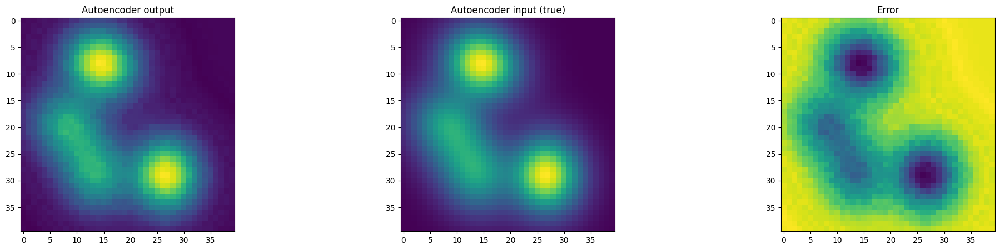

In [11]:
sidx = 0 # Snapshot index

fig = plt.figure(figsize=(25, 5))
ax0 = fig.add_subplot(131)
ax0.imshow(g[:, sidx].reshape((40, 40, 40))[:,:,20])
ax0.set_title('Autoencoder output')

ax1 = fig.add_subplot(132)
ax1.imshow(cube_data[:, sidx].reshape((40, 40, 40))[:,:,20])
ax1.set_title('Autoencoder input (true)')

ax2 = fig.add_subplot(133)
ax2.imshow(error[:, sidx].reshape((40, 40, 40))[:,:,20])
ax2.set_title('Error')

plt.show()

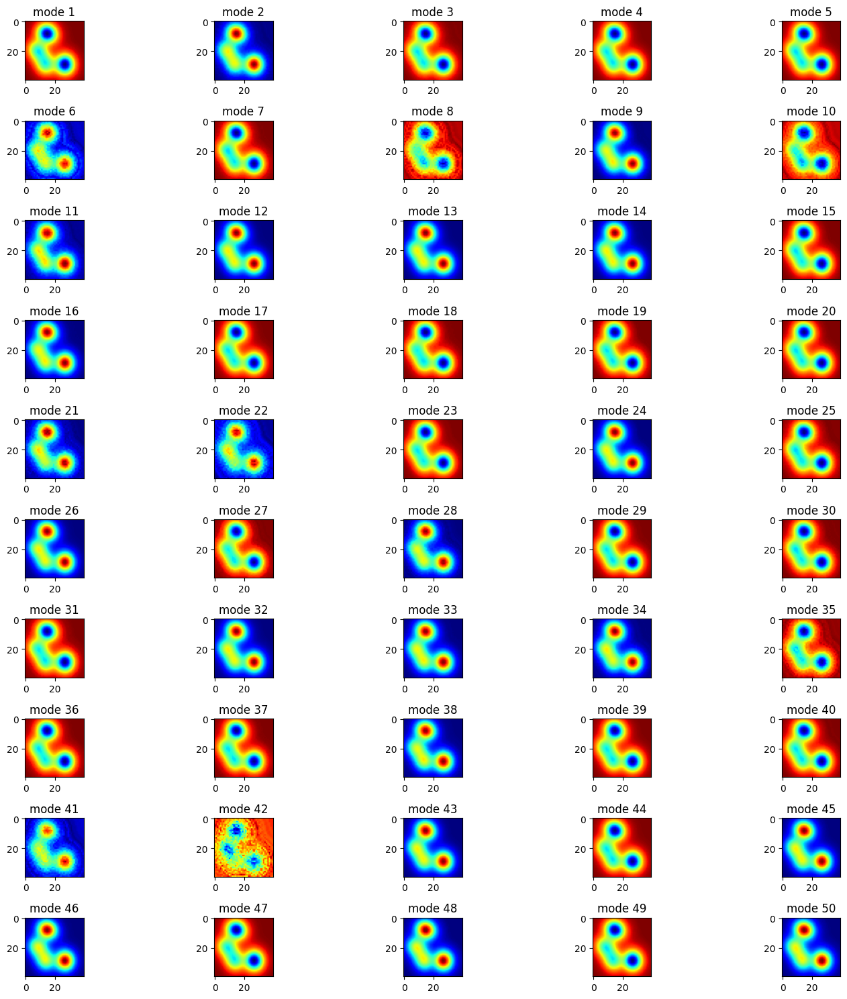

In [12]:
auto_modes = A.encoder(cube_data)
fig = plt.figure(figsize=(15, 15))

for k in range(50):
    mode = auto_modes[:, k].numpy()
    uplot = mode.reshape((40, 40,40))[:,:,20]
    ax = fig.add_subplot(10, 5, k+1)
    ax.imshow(uplot, cmap='jet')
    ax.set_title('mode %d'%(k+1))
plt.tight_layout()
plt.show()